In [1]:
from PIL import Image
import numpy as np
from tqdm import tqdm
from glob import glob
import pandas as pd
import seaborn as sns
from joblib import Parallel, delayed

In [ ]:
'''
  24109 3328 x 4096
   9042 2560 x 3328
   8267 4915 x 5355
   8221 2082 x 2776
   2703 1914 x 2294
   1276 2394 x 3062
    732 3540 x 4740
    338 4728 x 5928
     13 2394 x 2850
      3 2045 x 2473
      2 1022 x 1236
'''

In [2]:
def crop_out_image(img, f=2):
    av = np.mean(img, axis=0)
    mi = np.min(img, axis=0)
    ma = np.max(img, axis=0)
    img = img[:, (((av - mi) > f) + ((av - ma) > f))]
    #print(img.shape)
    return img

def crop_out_imageB(img, f=2):
    av = np.mean(img, axis=1)
    mi = np.min(img, axis=1)
    ma = np.max(img, axis=1)
    img = img[(((av - mi) > f) + ((av - ma) > f)), :]
    #print(img.shape)
    return img

def getSize(fn):
    pil = Image.open(fn)
    arr = np.asarray(pil)
    arr = crop_out_image(arr)
    arr = crop_out_imageB(arr)
    rows, cols = arr.shape
    return dict(rows=rows, cols=cols)

In [37]:
pat = '/fast/rsna-breast/pngfull-new/*/*.png'
R = []
#for fn in tqdm(glob(pat)):
#    rows, cols = getSize(fn)
#    R.append()

R = Parallel(n_jobs=32)(delayed(getSize)(f) for f in tqdm(glob(pat)))

sizeDF = pd.DataFrame(R)
sizeDF


  1%|█▏                                                                                            | 672/54706 [00:09<11:32, 77.99it/s]

KeyboardInterrupt: 

In [39]:
pat = '/fast/rsna-breast/pngfull-new/*/*.png'

R = Parallel(n_jobs=32)(delayed(getSize)(f) for f in glob(pat))

sizeDF = pd.DataFrame(R)
sizeDF

  1%|█▎                                                                                          | 799/54706 [00:55<1:01:57, 14.50it/s]


,rows,cols
0,4072,2551
1,3351,2321
2,4072,2489
3,3221,2208
4,4057,1768
...,...,...
54701,3311,1884
54702,2246,1137
54703,2776,1267
54704,2492,1072


In [40]:
sizeDF.to_csv('cropSizes.csv', index=False)

In [30]:
sizeDF

,rows,cols
0,4072,2551
1,3351,2321
2,4072,2489
3,3221,2208
4,4057,1768
5,3531,1689
6,3820,1615
7,4072,1846
8,2683,1603
9,2744,1573


In [44]:
sizeDF.value_counts()

rows  cols
2294  1914    154
3062  2394    112
4062  3328     71
4072  3328     53
      1963     17
             ... 
3054  1108      1
      1155      1
      1174      1
      1202      1
5928  4728      1
Length: 44382, dtype: int64

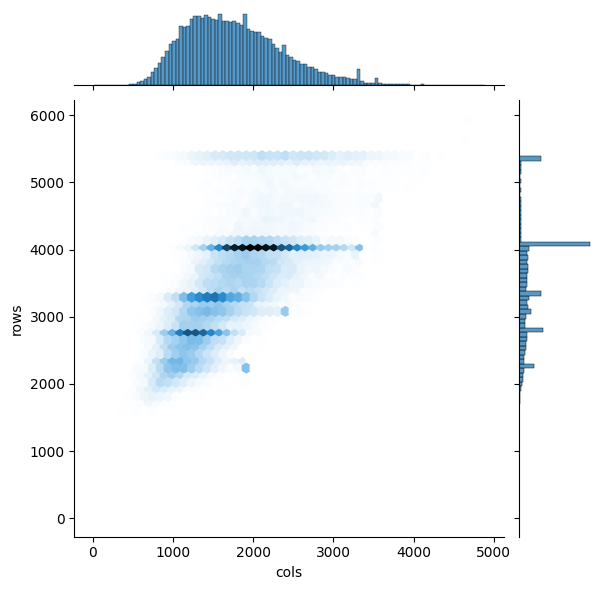

In [43]:
sns.jointplot(data=sizeDF, y='rows', x='cols', kind='hex')

(4096, 3328)


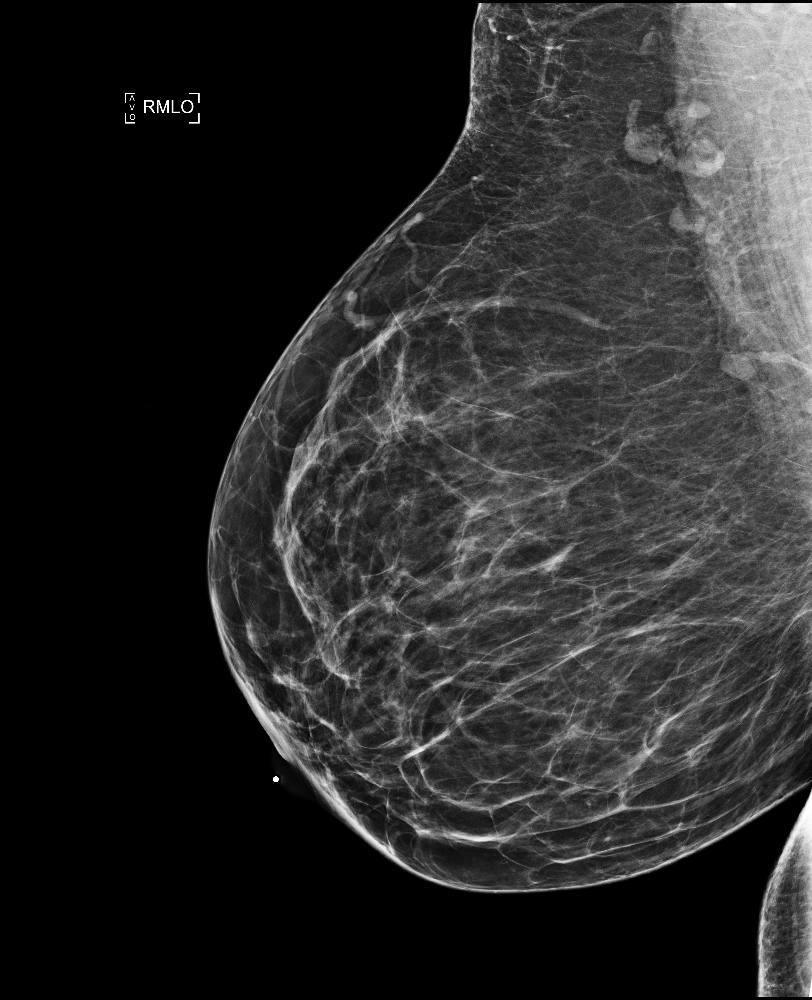

In [3]:
F = '/fast/rsna-breast/pngfull-new/35652/1509241486.png'
#F = '/fast/rsna-breast/pngfull-new/500/1083423452.png'
pil = Image.open(F)
arr = np.asarray(pil)
print(arr.shape)
Image.fromarray(arr)

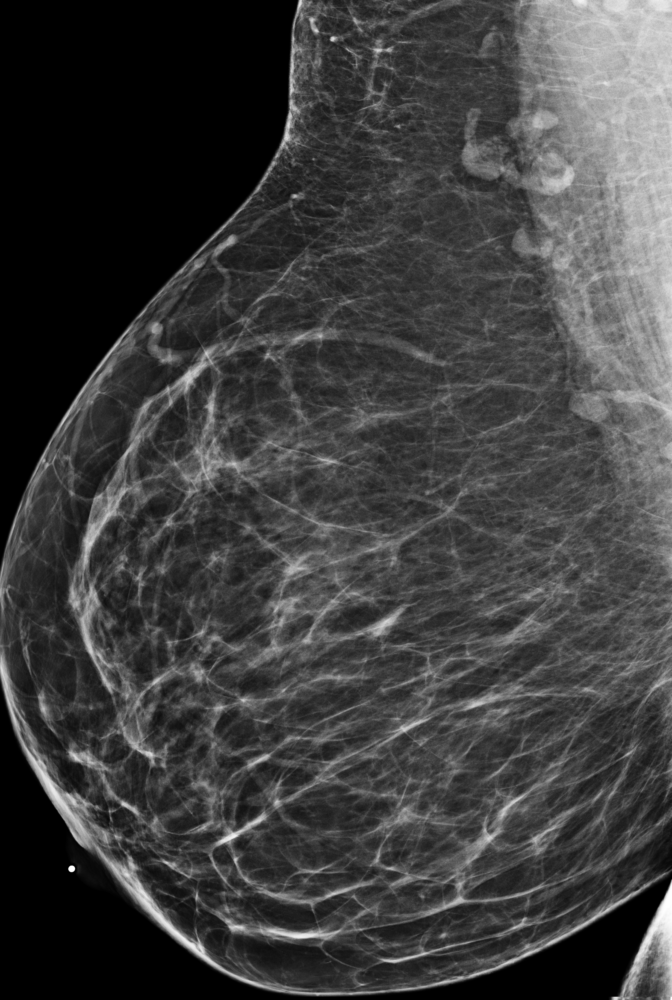

In [8]:
A=crop_out_image(arr, f=10)
Image.fromarray(crop_out_imageB(A, f=10))